<a href="https://colab.research.google.com/github/Rickmwasofficial/Learning-Machine-Learning/blob/main/Dog_Vision2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Using Transfer Learning and TensorFlow to classify different Dog Breeds

In [1]:
# Download and Unzip the data
!wget https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip # download files from Dropbox as zip

import os
import zipfile

local_zip = 'dog-breed-identification.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('Dog Vision') # unzip the files into a file called "Dog Vision"
zip_ref.close()

--2024-07-10 00:41:19--  https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6057:18::a27d:d12
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a [following]
--2024-07-10 00:41:20--  https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uce9875619ca10c1d714bf8a989e.dl.dropboxusercontent.com/cd/0/inline/CWZvxGnUCpeXAO3_kfken53l0_dBYN4Eq5uy3hA2SsVz1K03swuYHHj8eYBPojpRkZACzC6E_WcTBxdA85k8zxlML5mYDgMajdLVZeFdi8Exd3ZsSa50zg3ehbZDbBEbFpHs8Fj1XeMI1bxkpFOqoukW/file# [following]
--2024-07-10 00:41:21--  https://uce9875619ca10c1d7

### End to End Multiclass Dog Breed Calssification

This notebook builds and end to end multiclass image classifier using Tensorflow and TF Hub.

#### 1. Problem
Identifying the breed of a dog given the image of dogs.

#### 2. Data
The data we are using is from Kaggles dog breed competition.
https://www.kaggle.com/c/dog-breed-identification/data

#### 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed with each test image.

#### 4. Features
Some info about the data:
> We are deaking with images

> We have 120 different classes

> Unstructured Data (Use deep learning/Transfer Learning)

> Over 10,000 testing set

> Over 10,000 training set




In [2]:
# Import our tools
import tensorflow as tf
print(tf.__version__)
import tensorflow_hub as hub
print(hub.__version__)

print("GPU is", "avalaible" if tf.config.list_physical_devices('GPU') else "not available")

2.15.0
0.16.1
GPU is avalaible


#### Getting Data Ready and turning it into tensors (Numerical representation)

In [3]:
# acessing data and checking out labels
import pandas as pd
label = pd.read_csv(r'Dog Vision/labels.csv')
print(label.describe())
label.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


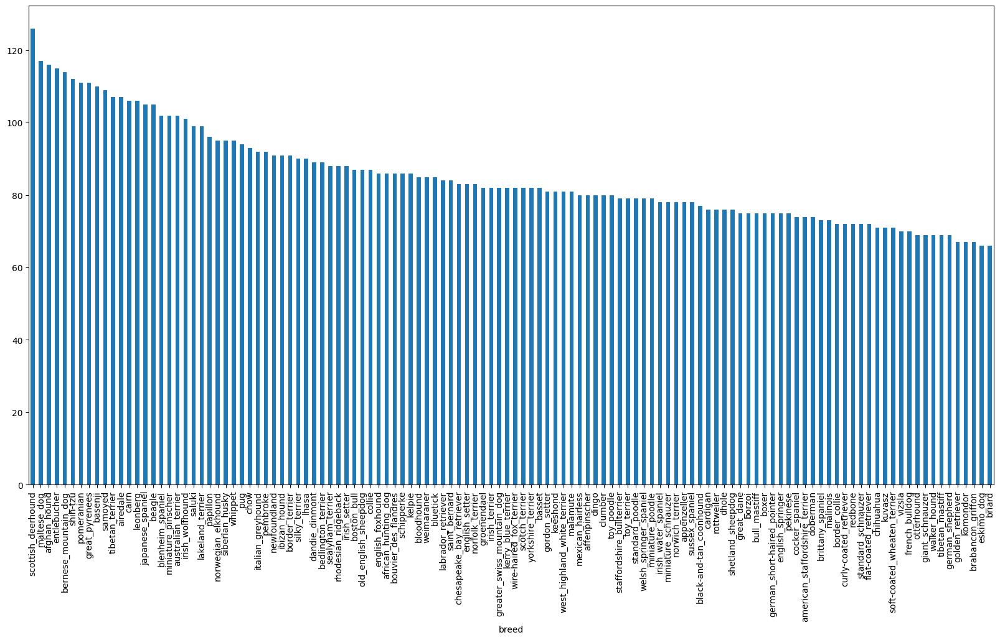

In [4]:
label.breed.value_counts().plot.bar(figsize=(20, 10));

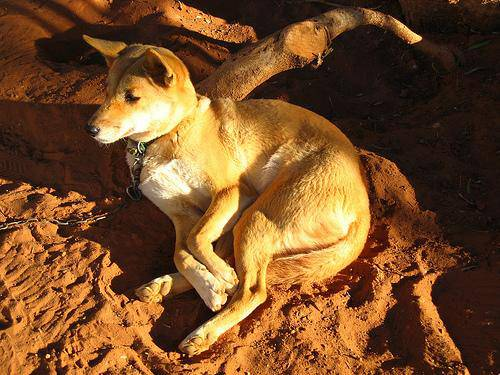

In [5]:
#lets view an image
from IPython.display import Image
Image('/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

Getting images and their labels


In [6]:
links = [f"/content/Dog Vision/train/{i}.jpg" for i in label.id]
links

['/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 '/content/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 '/content/Dog Vision/train/0075dc49dab4024d12fafe67074d8a81.j

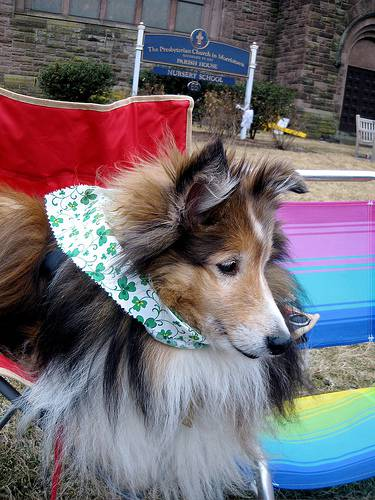

In [7]:
Image(links[10])

In [8]:
# check if number of filenames matches number of actual files
import os
if len(os.listdir('/content/Dog Vision/train/')) == len(links):
  print(True)
else:
  print(False)

True


### Now turn labels into numbers

In [9]:
import numpy as np
labels_arr = np.array(label.breed)
labels_arr

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
len(labels_arr)

10222

In [11]:
labels_arr[9000]

'tibetan_mastiff'

In [12]:
unique_labels = np.unique(labels_arr)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [13]:
# Turn every label to a boolean array
boolean_labels = [label == unique_labels for label in labels_arr]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
boolean_labels[9000].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

# **Create Our Own validation Set**

In [15]:
# set up X and y variables
X = links
y = boolean_labels

In [16]:
# Reduce images to 1000 to minimize experimentation time. Will train with the whole dataset if it works
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [17]:
# split data into train and test
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing Images

Turning Images into Tensors

In [18]:
X_train[:5], y_train[:5]

(['/content/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

In [19]:
# Before we do so, let's see what importing an image looks like
from matplotlib.pyplot import imread
image = imread(links[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
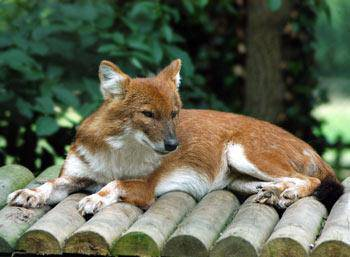

In [20]:
image

In [21]:
#turn image into a tensor
tf.image.convert_image_dtype(tf.constant(image), tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34901962, 0.5372549 , 0.34901962],
        [0.29803923, 0.48627454, 0.29803923],
        [0.24705884, 0.43529415, 0.2392157 ],
        ...,
        [0.3019608 , 0.52156866, 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ]],

       [[0.28235295, 0.4666667 , 0.29411766],
        [0.2627451 , 0.44705886, 0.26666668],
        [0.24705884, 0.43137258, 0.2509804 ],
        ...,
        [0.29411766, 0.5137255 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21960786, 0.40784317, 0.25882354],
        [0.227451  , 0.4156863 , 0.26666668],
        [0.2509804 , 0.43921572, 0.2901961 ],
        ...,
        [0.2784314 , 0.49803925, 0.32156864],
        [0.28627452, 0.5058824 , 0.32941177],
        [0.2901961 , 0.50980395, 0.33333334]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [22]:
# Now we've seen what an image looks like as a tensor, now let create a dfunction to preprocess that

IMG_SIZE = 224

# Create a function for pre-processing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turn it into a tensor
  """
  #Read the image
  img = tf.io.read_file(image_path)
  #turn image into numerical tensors with 3 channels i.e RGB
  image = tf.image.decode_jpeg(img, channels=3)
  #convert the color channel values from 0-255 to 0-1 (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize our image to desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

Suitable batch is 32. i.e we take the first 32 images and work on them, then go to the next 32 etc...

This is helpful because if you have a large dataset eg 10,000+ they might not fit into memory.

In order to use tensorflow effectively, we need to have our data in form of tuples.
`(image, labels)`

In [23]:
# create a simple function to return a tuple
def get_image_label(image_path, label):
  """
  Takes an image path and its label and converts to a tuple
  """
  image = process_image(image_path)
  return image, label

In [24]:
# Function to turn all of our data X and y into batches
BATCH_SIZE = 32
def create_batch(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image X and y labels.
  It shuffles the data if it is training data but doesn't shuffle if it is validation data
  Also accepts test data as input, therefore y can be None
  """

  if test_data:
    print("Creating test data Batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling path names and labels before mapping
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [25]:
# Create training and validation data batches
train_data = create_batch(X_train, y_train)
valid_data = create_batch(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [26]:
# Checking out different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing our data batches

In [27]:
import matplotlib.pyplot as plt

# create a function that visualizes images in a data batch
def visualize_images(images, labels):
  """
   Displays a plot of images and their labels from a data batch
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")


In [28]:
train_images, train_labels = next(train_data.as_numpy_iterator())

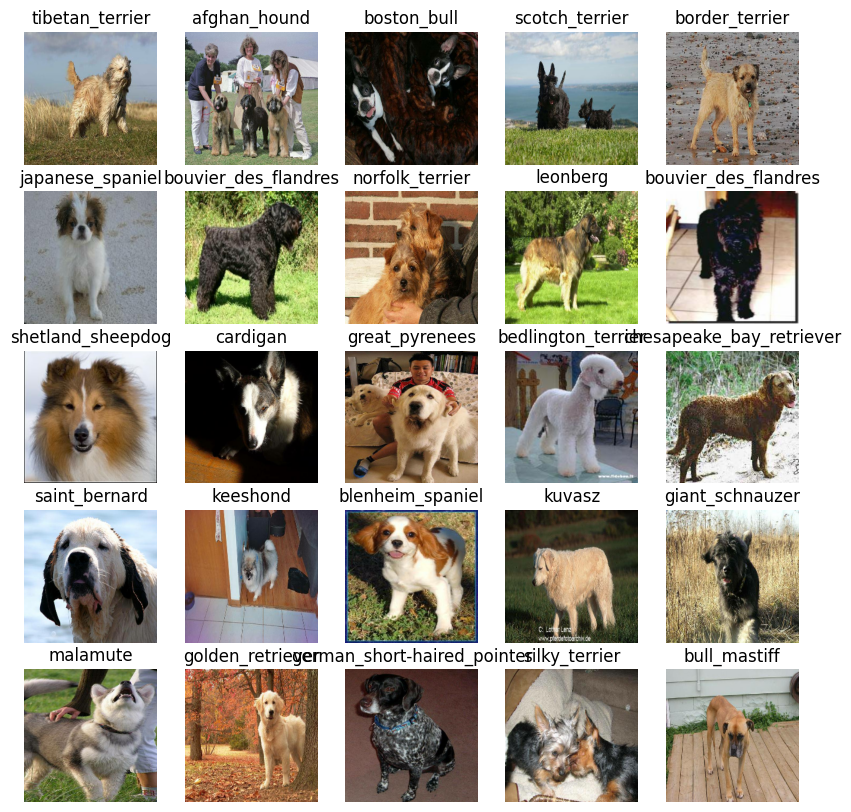

In [29]:
visualize_images(train_images, train_labels)

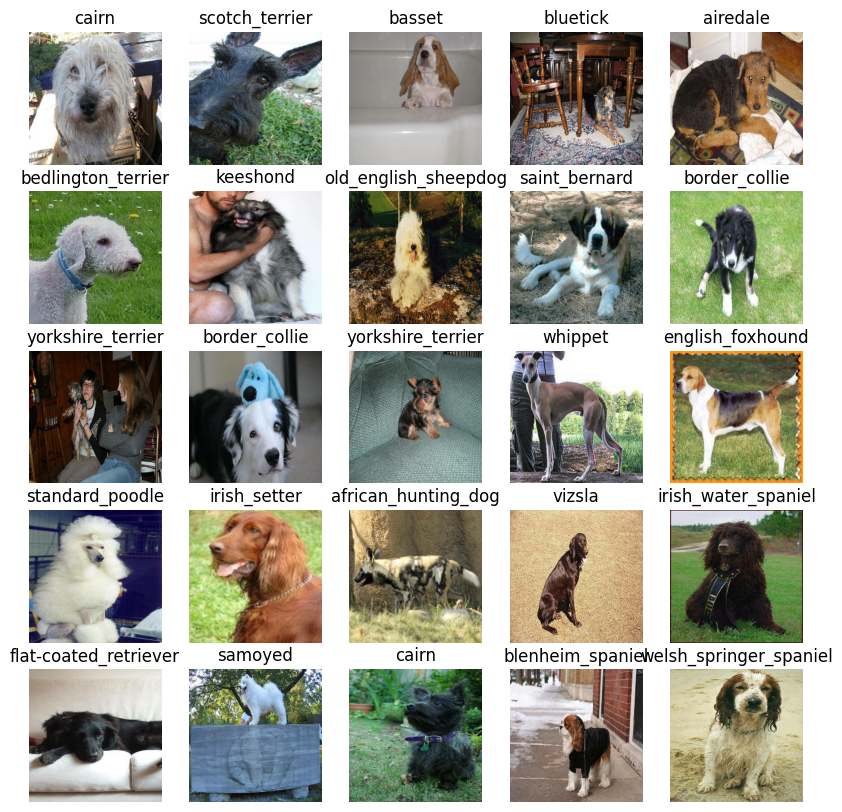

In [30]:
val_images, val_labels = next(valid_data.as_numpy_iterator())
visualize_images(val_images, val_labels)

## Preparing our Inputs and Outputs

Define Input Shape and output Shape

The Url of the model you want to use

In [31]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, channel
OUTPUT_SHAPE = len(unique_labels)

# Setup Model URL from Tensorflow hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"


In [32]:
def create_model(INPUT_SHAPE=INPUT_SHAPE, OUTPUT_SHAPE=OUTPUT_SHAPE, MODEL_URL=MODEL_URL):
  print(f"Building model with {MODEL_URL}")
  # Set Up the model Layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),# Layer 1 input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation='softmax')])# Layer 2 Output layer

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  return model


In [33]:
model = create_model()
model.summary()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

TensorBoard which helps track our model
and another for early stopping

## TensorBoard Callback

To set up a tensorboard callback, we need to:

1. Load the tensorboard notebook extension
2. Create a tensorboard callback that is able to save logs to a directory and pass it to our model's `fit` function
3. Visualize our model's training logs with tensorboard magic function (after model training)

In [34]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [35]:
import datetime
# Create a function to build a tensorb0rad callback
def create_tensorboard_callback():
  # Create a log directory to store tensorboard logs
  logdir = os.path.join("/content/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Helps prevent overfitting by stopping training if a certain evaluation metric stops improving

In [36]:
# Create earlystopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3) # Number of epochs without improvement b4 training stops

## Training a model

We train on 1000 images to make sure everything is working first

In [37]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}



In [38]:
# A function which trains the model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()
  # Create a new TensorBoard Session everytime we create a model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data, passin it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model


In [39]:
# train the model
model = train_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 10s 124ms/step - loss: 4.5758 - accuracy: 0.0812 - val_loss: 3.3869 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 2s 86ms/step - loss: 1.6437 - accuracy: 0.6938 - val_loss: 2.0974 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 2s 87ms/step - loss: 0.5731 - accuracy: 0.9413 - val_loss: 1.5789 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 2s 65ms/step - loss: 0.2525 - accuracy: 0.9900 - val_loss: 1.4248 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 2s 76ms/step - loss: 0.1485 - accuracy: 0.9975 - val_loss: 1.3213 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 2s 66ms/step - loss: 0.1005 - accuracy: 0.9987 - val_loss: 1.2758 - val_accuracy: 0.6350
Epoch 7/100
25/25 [====================

## Seems like the model is overfitting since it does well on the training data than on the validation data

In [40]:
# Load up tensorboard to see how the models are perfoming
%tensorboard --logdir /content/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [41]:
# Make predictions on the validation data
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 4s 57ms/step


array([[4.6327515e-03, 3.2917942e-05, 1.3473175e-03, ..., 1.2637922e-03,
        2.8224842e-05, 1.4166096e-03],
       [2.4908558e-03, 5.6909374e-04, 4.3672983e-02, ..., 4.8642364e-04,
        8.7529328e-04, 2.2668160e-04],
       [5.5821605e-05, 1.0789062e-05, 1.5391150e-05, ..., 4.6581172e-05,
        2.7230559e-05, 2.4755311e-03],
       ...,
       [1.6271212e-06, 4.4255117e-05, 4.4113200e-05, ..., 3.2298998e-05,
        7.9369238e-05, 4.1817791e-05],
       [5.2302000e-03, 1.5468242e-04, 3.4578625e-04, ..., 4.3911194e-05,
        9.7551776e-05, 4.3084570e-03],
       [2.7020791e-04, 1.0126329e-05, 9.4301795e-05, ..., 3.5252429e-03,
        4.3865826e-04, 2.9970604e-05]], dtype=float32)

In [42]:
predictions[0]

array([4.63275146e-03, 3.29179420e-05, 1.34731748e-03, 4.58578346e-04,
       5.95053716e-04, 4.74139051e-05, 4.39489558e-02, 4.50324500e-04,
       6.47264533e-05, 3.09767172e-04, 2.64227157e-04, 7.30941771e-04,
       5.92702942e-04, 1.98280861e-04, 1.18422460e-04, 1.64725550e-03,
       2.35920743e-05, 1.23908490e-01, 2.17953730e-05, 6.56274133e-05,
       1.08218088e-03, 8.70180957e-05, 2.79062078e-05, 1.32462534e-03,
       1.66718935e-04, 1.79469891e-04, 9.52037349e-02, 4.69417835e-04,
       2.90486962e-04, 1.36175822e-03, 3.47369532e-05, 6.98902132e-03,
       3.56189936e-04, 1.38979567e-05, 9.85001025e-05, 2.29008961e-02,
       4.55974623e-05, 3.07414011e-04, 1.37872310e-04, 3.31606825e-05,
       2.26429082e-03, 4.26611841e-05, 1.54955978e-05, 1.56907670e-04,
       9.43138184e-06, 5.10925078e-04, 3.89461202e-05, 3.36146622e-05,
       2.42309427e-04, 9.36975630e-05, 1.22265497e-04, 1.64445669e-06,
       5.02122530e-05, 4.13081638e-04, 1.12182810e-04, 1.92309104e-04,
      

In [43]:
# First Prediction
index = 42
print(predictions[index])
print(f"Max probability: {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Dog Breed: {unique_labels[np.argmax(predictions[index])]}")

[1.37254043e-04 1.22231377e-05 1.79565213e-05 4.87722855e-06
 4.13911045e-03 5.53134596e-05 7.16691211e-05 1.33024273e-03
 3.95231368e-03 5.21919392e-02 5.67350935e-06 8.94878121e-06
 1.11899739e-04 1.69582735e-03 4.02344333e-04 1.41737971e-03
 2.65086001e-05 3.62734136e-05 5.88209878e-05 6.24987006e-05
 2.11761817e-05 2.35619853e-04 1.38666830e-04 3.24021639e-05
 8.82192887e-03 1.74071611e-05 2.51174006e-05 3.27465532e-05
 3.32807977e-05 7.39406169e-05 2.56897943e-06 8.41998190e-05
 2.93024386e-05 3.14894096e-05 1.22143392e-05 1.54191257e-05
 6.22356893e-05 2.63986440e-04 2.79425894e-05 1.13079853e-01
 7.52656924e-05 1.72717973e-05 6.96402742e-03 5.99569603e-06
 2.12626008e-04 7.76172328e-06 7.67383899e-05 2.76835286e-04
 2.55475425e-05 4.18123062e-04 3.64001389e-05 5.64580223e-05
 1.31754336e-04 2.42279703e-03 3.26412760e-06 5.57649473e-04
 5.44262111e-05 5.35413119e-06 9.90733024e-05 7.26482176e-05
 2.44634539e-05 1.04728178e-03 9.28698864e-06 1.50475262e-05
 2.00260343e-04 1.064652

Having the above functionality is great but we want to do it at scale. It would be even better to see the image the prediction is being made on.

Prediction probabilities is also known as confidence levels

In [44]:
# Turn Probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_labels[np.argmax(prediction_probabilities)]

# # Get a prediction label based on an array of prediction probabilities
# pred_label = get_pred_label(predictions[81])
# pred_label


### Now since our validation data is still in a batch data form, we will have to unbatch to make predictions on the validation images and then compare on the validation labels

In [45]:
images_ = []
labels_ = []

for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(unique_labels[np.argmax(label)])

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [46]:
# Check how many were correct out of the 200
sum = 0
for i in range(200):
  if labels_[i] == get_pred_label(predictions[i]):
    sum += 1

sum

131

In [47]:
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors and separates them into different arrays of images and labels
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images, labels

valid_images, valid_labels = unbatchify(valid_data)


### Visualizing Model Predictions

* Create a function that takes an array of prediction probabilities,
truth labels and an array of labels and integers
* Convert prediction probabilities into a predicted label
* Plot the predicted label, its predicted probability, truth label and the target image at a single point


In [48]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and and image for sample n
  """
  pred_prob, label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title based on whether the prediction is right or wrong
  if pred_label == label:
    color = 'green'
  else:
    color = 'red'

  # plot the title
  plt.title("Prediction: {} Accuracy: {:2.0f}% True Label: {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    label),
            color=color)

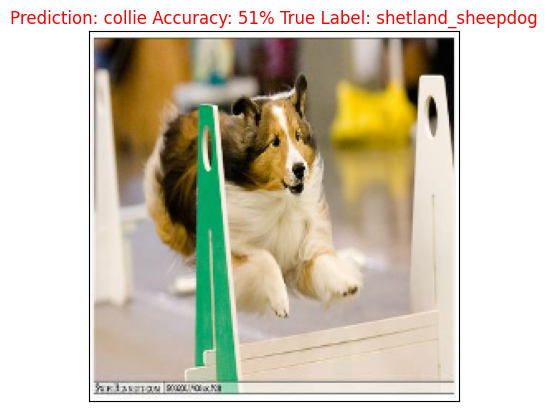

In [49]:
plot_pred(predictions, valid_labels, valid_images, n=196);

### Now there is a function to visualize the model's top predictions, now I will create another to visualize the top 10 predictions

The func will:
* Do as the above
* Find the top 10:
  * Prediction Probabilities Indexes
  * Prediction Probabilities Values
  * Prediction Labels
* Plot the top 10 probabilities values and labels. Coloring the true label red

In [50]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
    Plots the top 10 highest prediction confidences with the truth labels for integer n
  """
  pred_prob, truth_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top ten prediction confidence index
  top_pred = pred_prob.argsort()[-10:][::-1]
  # Find ethe top ten confidence values
  top_pred_values = pred_prob[top_pred]
  # Find the top 10 prediction labels
  top_pred_label = unique_labels[top_pred]

  # Plot
  top_plot = plt.bar(np.arange(len(top_pred_label)),
                     top_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_pred_label)),
             labels=top_pred_label,
             rotation='vertical')
  # Change Color of True Label
  if np.isin(pred_label, top_pred_label):
    top_plot[np.argmax(top_pred_label == truth_label)].set_color("green")
  else:
    pass



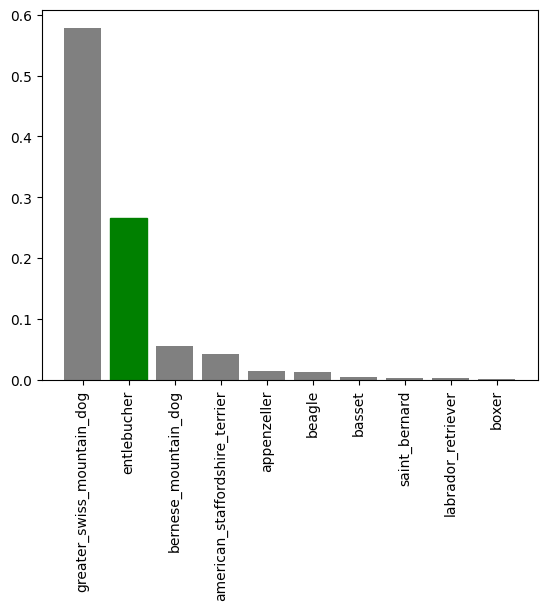

In [51]:
plot_pred_conf(predictions, valid_labels, n=97)

## Now there are some functions to help us visualize our predictions and evaluate our model, let's check out a few

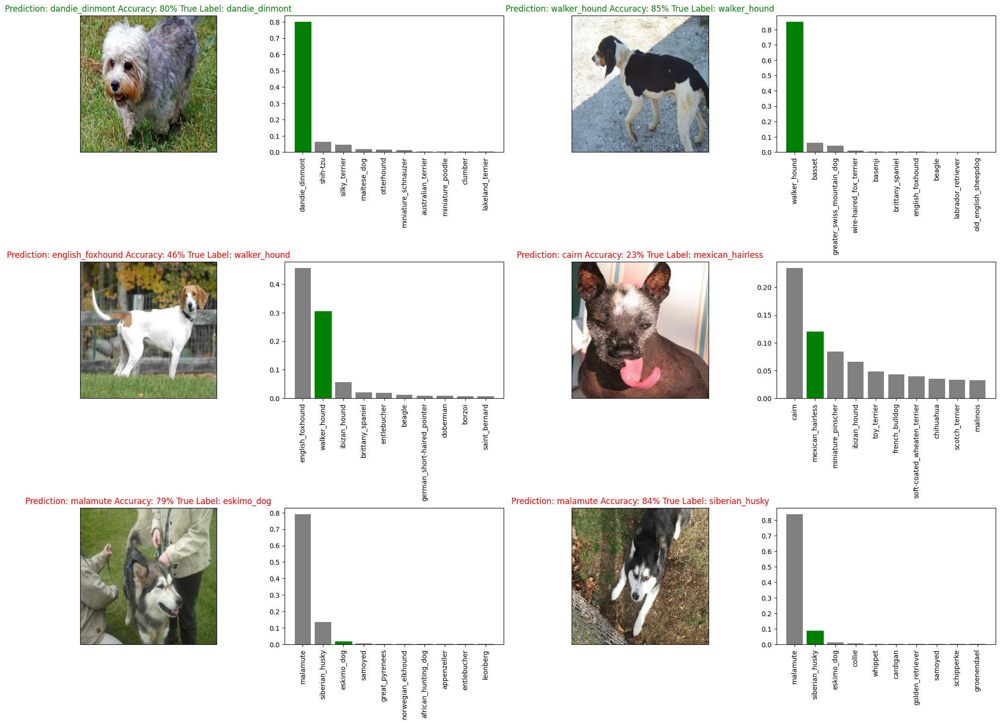

In [52]:
i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, valid_labels, valid_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, valid_labels, n=i+i_multiplier)


plt.tight_layout(h_pad=1.0)
plt.show()

In [64]:
## Saving the model and reloading it
from tensorflow.keras.layers import deserialize
from tensorflow.keras.utils import get_file
import keras

def save_model(model, suffix=None):
  model_dir = os.path.join("/content/model/", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = model_dir + '-' + suffix + ".h5"
  def MyCustomObject(config):
    """
    Function to deserialize the custom layer object from TensorFlow Hub.
    """
    return deserialize(get_file(config["url"], config["file_hash"]))

  # Register the custom object with its name (assuming it's 'hub.KerasLayer')
  custom_objects = {'hub.KerasLayer': MyCustomObject}
  print(f"Saving model to {model_path}...")
  with keras.utils.custom_object_scope(custom_objects):
    model.save(model_path)
  return model_path

def load_model(path):
  model = tf.keras.models.load_model(path,
                                     custom_objects={'KerasLayer': hub.KerasLayer})
  return model


## Training on the full dataset

In [54]:
len(X), len(y)

(10222, 10222)

In [55]:
# Create a data batch with the full dataset
full_data = create_batch(X, y)

Creating training data batches...


In [56]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Create the model
full_model = create_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [58]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on full data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)


In [59]:
# fit the full model to the data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 26s 65ms/step - loss: 1.3516 - accuracy: 0.6658
Epoch 2/100
320/320 [==============================] - 18s 55ms/step - loss: 0.4006 - accuracy: 0.8832
Epoch 3/100
320/320 [==============================] - 19s 60ms/step - loss: 0.2387 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 18s 56ms/step - loss: 0.1535 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 18s 55ms/step - loss: 0.1078 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 19s 58ms/step - loss: 0.0761 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0575 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 17s 54ms/step - loss: 0.0457 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 18s 56ms/step - loss: 0.0367 - accuracy: 0.9972
Epoch 10/100
320/320 [==============================] - 17s 54ms/step - l

In [65]:
save_model(full_model, suffix="Trained-on-10000-mobilenetv2-adam")

Saving model to /content/model/20240710-005316-Trained-on-10000-mobilenetv2-adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/model/20240710-005316-Trained-on-10000-mobilenetv2-adam.h5'

## Making predictions on the test images

In [ ]:
## Covert test data into tensor batches
test_path = "/content/Dog Vision/test/"
test_file_names = [test_path + fname for fname in os.listdir(test_path)]
test_file_names[:10]

In [ ]:
# Convert filenames into data batches
test_data = create_batch(test_file_names, test_data=True)

In [ ]:
test_data

In [ ]:
# Make predictions on test data batch
test_predictions = full_model.predict(test_data, verbose=1)

In [ ]:
# Save the predictions into a csv file
np.savetxt("/content/Dog Vision/preds_arr.csv", test_predictions, delimiter=',')

In [ ]:
test_predictions[:10]

# Preparing test dataset predictions for Kaggle

In [ ]:
# Submitting model to Kaggle
# Create a pandas DF
preds_df = pd.DataFrame(columns=['id'] + list(unique_labels))
preds_df

In [ ]:
# add data to the id column by extracting the id from the image filepath
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

In [ ]:
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_labels)] = test_predictions
preds_df.head()

In [ ]:
preds_df.to_csv("/content/submission_mobilenetv2.csv", index=False)

In [ ]:
model = load_model("/content/model/20240708-075829-Trained-on-10000-mobilenetv2-adam.h5")

## Making Predictions on custom Images

In [ ]:
!pip install flask.ngrok

In [ ]:
from flask import Flask, request, render_template, redirect, url_for
from werkzeug.utils import secure_filename
import os
import keras
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
from matplotlib.pyplot import imread

app = Flask(__name__)

# # def load_model(path):
#   model = keras.models.load_model(path,
#                                      custom_objects={'KerasLayer': hub.KerasLayer})
#   return model

# Load the trained model
MODEL_PATH = '20240708-142818-Trained-on-10000-mobilenetv2-adam.keras'
print("Started")
model = load_model("/content/20240708-142818-Trained-on-10000-mobilenetv2-adam.keras")
print("Model Loaded........")
# Ensure the 'uploads' directory exists
UPLOAD_FOLDER = 'static/uploads'
if not os.path.exists(UPLOAD_FOLDER):
    os.makedirs(UPLOAD_FOLDER)

app.config['UPLOAD_FOLDER'] = UPLOAD_FOLDER
app.config['ALLOWED_EXTENSIONS'] = {'png', 'jpg', 'jpeg'}

def allowed_file(filename):
    return '.' in filename and \
           filename.rsplit('.', 1)[1].lower() in app.config['ALLOWED_EXTENSIONS']


IMG_SIZE = 224

# Create a function for pre-processing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turn it into a tensor
  """
  #Read the image
  img = tf.io.read_file(image_path)
  #turn image into numerical tensors with 3 channels i.e RGB
  image = tf.image.decode_jpeg(img, channels=3)
  #convert the color channel values from 0-255 to 0-1 (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize our image to desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Function to turn all of our data X and y into batches
BATCH_SIZE = 32
def create_batch(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image X and y labels.
  It shuffles the data if it is training data but doesn't shuffle if it is validation data
  Also accepts test data as input, therefore y can be None
  """

  if test_data:
    print("Creating test data Batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling path names and labels before mapping
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

def prepare_image(file_path):
    img = process_image(file_path)
    img_batch = create_batch(img, true_data=True)
    return img_batch

# Turn Probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_labels[np.argmax(prediction_probabilities)]

@app.route('/', methods=['GET', 'POST'])
def upload_file():
    if request.method == 'POST':
        if 'file' not in request.files:
            return redirect(request.url)
        file = request.files['file']
        if file.filename == '':
            return redirect(request.url)
        if file and allowed_file(file.filename):
            filename = secure_filename(file.filename)
            file_path = os.path.join(app.config['UPLOAD_FOLDER'], filename)
            file.save(file_path)

            # Prepare and predict
            img = prepare_image(file_path)
            prediction = model.predict(img)
            predicted_class = get_prediction_labels(prediction)

            return render_template('index.html', filename=filename, predicted_class=predicted_class[0])
    return render_template('index.html')


@app.route('/')
def index():
    return render_template("index.html")


In [ ]:
from flask_ngrok import run_with_ngrok
run_with_ngrok(app)
